Authors: Desiree Himuškin, Markus Rene Pae & Toomas Kangur
# LTAT.02.011 Network Analysis: course project
## Network Analysis of Movie and Actor Relationships on IMDb

This notebook supports the analysis part of our project. We assume that you already have a DuckDB instance filled with necessary tables. If not, please visit `setup.ipynb`.

Let's start with basic imports and connecting to our database.

In [1]:
#!pip install -r requirements.txt
#!pip install duckdb

In [2]:
import duckdb
import pandas as pd

# Connect to a persistent DuckDB database file
conn = duckdb.connect("imdb.duckdb")

As mentioned in the setup, we are dealing with 7 tables:
1. `name_basics`
2. `title_akas`
3. `title_basics`
4. `title_crew`
5. `title_episode`
6. `title_principals`
7. `title_ratings`

The following query shows a detailed overview about our schema.

In [3]:
df = conn.execute("""
SELECT table_name, column_name, data_type
FROM information_schema.columns
WHERE table_schema = 'main'
ORDER BY table_name, ordinal_position;
""").df()

display(df)

,table_name,column_name,data_type
0,name_basics,nconst,VARCHAR
1,name_basics,primary_name,VARCHAR
2,name_basics,birth_year,INTEGER
3,name_basics,death_year,INTEGER
4,name_basics,primary_profession,VARCHAR[]
5,name_basics,known_for_titles,VARCHAR[]
6,title_akas,title_id,VARCHAR
7,title_akas,CAST(ordering AS INTEGER),INTEGER
8,title_akas,title,VARCHAR
9,title_akas,region,VARCHAR


The following cell lists all titles and actors along with other interesting information (average rating, runtime, country, etc.). This should be useful for analysis.

In [4]:
df = conn.execute("""
    SELECT 
        tb.tconst,
        tb.primary_title AS movie_title,
        tb.start_year,
        tb.runtime_minutes,
        tb.genres,
        tr.average_rating,
        tr.num_votes,
        nb.primary_name AS actor_name,
        nb.birth_year,
        nb.primary_profession,
        tp.category,
        tp.characters,
        ta.region
    FROM title_basics tb
    JOIN title_ratings tr 
        ON tb.tconst = tr.tconst
    JOIN title_principals tp
        ON tb.tconst = tp.tconst
    JOIN name_basics nb
        ON tp.nconst = nb.nconst
    JOIN title_akas ta
        ON tb.tconst = ta.title_id
    WHERE tb.title_type = 'movie'
        AND tb.start_year >= 2010
        AND tb.start_year <= 2024
        AND ta.region = 'US'
        AND tp.category IN ('actor', 'actress')
        AND tb.genres IS NOT NULL AND array_length(genres) > 0
        AND tb.runtime_minutes IS NOT NULL AND tb.runtime_minutes > 15
    ORDER BY tr.average_rating DESC, tr.num_votes DESC
""").df()

display(df.head(10))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,tconst,movie_title,start_year,runtime_minutes,genres,average_rating,num_votes,actor_name,birth_year,primary_profession,category,characters,region
0,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,King B.,<NA>,"[actor, director, producer]",actor,"[""Royal T.""]",US
1,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Brian 'Da Wildcat' Smith,<NA>,"[actor, writer, producer]",actor,"[""Grimmy""]",US
2,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Maria Geiger,<NA>,[actress],actress,"[""Donna""]",US
3,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Tiphanie Nichole Rae,<NA>,[actress],actress,"[""Rachael""]",US
4,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Olivia Gant,<NA>,[actress],actress,"[""Eve""]",US
5,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Damn Fool,<NA>,"[actor, writer]",actor,"[""Ed""]",US
6,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Cookie Pearl Reid,<NA>,"[actress, miscellaneous]",actress,"[""Susan""]",US
7,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Brandall Cole,<NA>,"[actor, writer, director]",actor,"[""Robber""]",US
8,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Brandon Glover,<NA>,[actor],actor,"[""Chump""]",US
9,tt15461714,King B.'s Hate... Love,2021,85,[Drama],10.0,14,Oz Man,<NA>,[actor],actor,"[""Ant""]",US


In [5]:
len(df)

732949

It appears that the dataset had some duplicate elements (in terms of title ID, actor name and cast category). We need to drop them and keep only one instance.

In [6]:
df.drop_duplicates(subset=['tconst', 'actor_name', 'category'], inplace=True)
len(df)

613933

And with that we got rid of 120K rows containing duplicates.
## Collaboration graph

In [7]:
# !pip install networkx

In the cell below, we create a collaboration network graph using networkx where nodes are actors and edges represent collaborations in movies. For each pair of actors that appear in the same movie, we add an edge between them with a weight indicating how many times they've worked together, while also storing the actor names as node attributes.

In [8]:
import networkx as nx
from itertools import combinations

G_collabs = nx.Graph()

for tconst, group in df.groupby('tconst'):
    actors = group['actor_name'].tolist()
    for actor1, actor2 in combinations(actors, 2):
        if actor1 == actor2:
            continue
        # Add nodes excplicitly to add name attributes
        if not G_collabs.has_node(actor1):
            G_collabs.add_node(actor1, name=actor1)
        if not G_collabs.has_node(actor2):
            G_collabs.add_node(actor2, name=actor2)
        # Add edge with weight
        if G_collabs.has_edge(actor1, actor2):
            G_collabs[actor1][actor2]['weight'] += 1
        else:
            G_collabs.add_edge(actor1, actor2, weight=1)

Now we analyze actor statistics by:
1. Counting how many movies each actor appears in
2. Calculating total collaborations (sum of edge weights) for each actor
3. Calculating unique collaborations (number of different actors worked with) for each actor
4. Creating a dataframe with these metrics and displaying the top 10 most prolific actors

In [9]:
# Group by actor_name and count the number of movies
actor_movie_counts = df.groupby('actor_name').size().reset_index(name='movie_count')

# Sort by movie count in descending order
sorted_actors = actor_movie_counts.sort_values('movie_count', ascending=False)

# Get the actor with the most movies
most_movies_actor = sorted_actors.iloc[0]
actor_name_most = most_movies_actor['actor_name']
num_movies_most = most_movies_actor['movie_count']

# Get the actor with the second most movies
second_most_movies_actor = sorted_actors.iloc[1]
actor_name_second = second_most_movies_actor['actor_name']
num_movies_second = second_most_movies_actor['movie_count']

print(f"Actor with the most movies: {actor_name_most} (Number of movies: {num_movies_most})")
print(f"Actor with the second most movies: {actor_name_second} (Number of movies: {num_movies_second})")

Actor with the most movies: Eric Roberts (Number of movies: 272)
Actor with the second most movies: Danny Trejo (Number of movies: 106)


In the cell below, we calculate total collaborations (sum of edge weights) and unique collaborations (number of different actors worked with) for each actor in the network. We identify and analyze the two most connected actors based on total collaborations, printing their:
- Total number of collaborations (weighted connections)
- Number of unique actors they've collaborated with

In [10]:
import networkx as nx

# Calculate total collaborations per actor (sum of edge weights)
collaboration_counts = {
    node: sum(data['weight'] for _, _, data in G_collabs.edges(node, data=True))
    for node in G_collabs.nodes
}

sorted_actors = sorted(collaboration_counts.items(), key=lambda x: x[1], reverse=True)
most_connected_actor, total_collaborations = sorted_actors[0]
second_connected_actor, second_total_collaborations = sorted_actors[1]

# Find how many unique actors they collaborated with (degree)
first_unique_collaborators = len(list(G_collabs.neighbors(most_connected_actor)))
second_unique_collaborators = len(list(G_collabs.neighbors(second_connected_actor)))

print(f"Most connected actor: {most_connected_actor}")
print(f"Total collaborations: {total_collaborations}")
print(f"Unique actors collaborated with: {first_unique_collaborators}")

print(f"Second most connected actor: {second_connected_actor}")
print(f"Total collaborations: {second_total_collaborations}")
print(f"Unique actors collaborated with: {second_unique_collaborators}")

Most connected actor: Eric Roberts
Total collaborations: 2394
Unique actors collaborated with: 2133
Second most connected actor: Danny Trejo
Total collaborations: 943
Unique actors collaborated with: 835


The following cell confirms that both Eric Roberts and Danny Trejo have the highest number of unique collaborations as well.

In [11]:
# Sort actors by the number of collabs (degree) in descending order
sorted_actors = sorted(G_collabs.degree, key=lambda x: x[1], reverse=True)

# Actor with the most collabs
most_collabs_actor = sorted_actors[0]
# Get the actor with the second most collabs
second_most_collabs_actor = sorted_actors[1]

# Extract the actor's name and number of collabs
actor_name_most_collabs = G_collabs.nodes[most_collabs_actor[0]]['name']
num_collabs_most = most_collabs_actor[1]

# Extract the actor's name and number of collabs
actor_name_2most_collabs = G_collabs.nodes[second_most_collabs_actor[0]]['name']
num_collabs_second = second_most_collabs_actor[1]

print(f"Actor with the most collabs: {actor_name_most_collabs} (Number of collabs: {num_collabs_most})")
print(f"Actor with the second most collabs: {actor_name_2most_collabs} (Number of collabs: {num_collabs_second})")

Actor with the most collabs: Eric Roberts (Number of collabs: 2133)
Actor with the second most collabs: Danny Trejo (Number of collabs: 835)


The following cell creates an output that is used in the final report: it prints the most prolific actors by number of movie appearances and their statistics.

In [12]:
# Sort actors by movie count
sorted_actors = actor_movie_counts.sort_values('movie_count', ascending=False).reset_index(drop=True)

# Calculate collaboration counts and unique collaborator counts
collaboration_counts = {}
unique_collab_counts = {}
for node in G_collabs.nodes:
    collaboration_counts[node] = sum(data['weight'] for _, _, data in G_collabs.edges(node, data=True))
    unique_collab_counts[node] = len(list(G_collabs.neighbors(node)))

# Convert collaboration counts dict to DataFrame
collab_df = pd.DataFrame({
    'actor_name': list(collaboration_counts.keys()),
    'collab_count': list(collaboration_counts.values()),
    'unique_collab_count': list(unique_collab_counts.values())
})

# Join the DataFrames
combined_df = sorted_actors.merge(collab_df, on='actor_name', how='outer')
combined_df.sort_values(by="movie_count", ascending=False).head()

,actor_name,movie_count,collab_count,unique_collab_count
91136,Eric Roberts,272,2394.0,2133.0
69892,Danny Trejo,106,943.0,835.0
292835,Tom Sizemore,105,928.0,827.0
309978,Yogi Babu,104,874.0,558.0
299887,Vennela Kishore,103,907.0,484.0


### PageRank as a measure of influence
why: An actor who collaborates with many well-connected actors gets a higher score, 
meaning that the number of connections is not as important as being connected to well-connected actors.
It handles weighted graphs well.

pagerank - who has reach
eigenvector- who's elite

In [13]:
# !pip install scipy

In the cell below, we calculate two centrality measures for the collaboration network. First, PageRank is computed to measure actor influence based on their connections to other influential actors. Second, eigenvector centrality is calculated, which is similar to PageRank but more focused on identifying "elite" actors. Both measures take into account the weighted edges (number of collaborations between actors). The results are stored as node attributes in the graph for later use.

In [14]:
pagerank = nx.pagerank(G_collabs, weight='weight')
nx.set_node_attributes(G_collabs, pagerank, name='pagerank')

eigen_centrality = nx.eigenvector_centrality(G_collabs, max_iter=1000, weight='weight')
nx.set_node_attributes(G_collabs, eigen_centrality, name='eigen_centrality')

In [15]:
# !pip install sklearn

The cell below performs several key steps to analyze and cluster actors based on their centrality measures:
1. Creates a DataFrame with PageRank and eigenvector centrality values
2. Scales both measures to [0,0.5] range and combines them
3. Adds degree centrality (number of collaborators) for each actor
4. Performs K-means clustering (k=4) three different ways:
   - Using only PageRank values
   - Using only eigenvector centrality 
   - Using combined scaled measures
5. Maps the clusters to meaningful labels (A-list through D-list)
   based on mean centrality values

This allows us to categorize actors into tiers based on their network influence and compare different ways of measuring that influence.


In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

centrality_df = pd.DataFrame.from_dict(pagerank, orient='index', columns=['pagerank'])
centrality_df['eigenvector'] = pd.Series(eigen_centrality)
# Scale pagerank to range [0, 0.5]
pagerank_scaler = MinMaxScaler(feature_range=(0, 0.5))
centrality_df['pagerank_scaled'] = pagerank_scaler.fit_transform(centrality_df[['pagerank']])
# Scale eigenvector centrality to range [0, 0.5]
eigenvector_scaler = MinMaxScaler(feature_range=(0, 0.5))
centrality_df['eigenvector_scaled'] = eigenvector_scaler.fit_transform(centrality_df[['eigenvector']])
# Combine scaled pagerank and eigenvector centrality
centrality_df['page_plus_eigen_scaled'] = centrality_df['pagerank_scaled'] + centrality_df['eigenvector_scaled']

degree_dict = dict(G_collabs.degree())  # Unweighted degree — just the number of neighbors
centrality_df['degree'] = pd.Series(degree_dict)

scaler = StandardScaler()
# KMEANS clustering on pagerank
X = scaler.fit_transform(centrality_df[['pagerank']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_page'] = kmeans.fit_predict(X)

# KMEANS clustering on eigenvector centrality
scaler = StandardScaler()
X = scaler.fit_transform(centrality_df[['eigenvector']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_eigen'] = kmeans.fit_predict(X)

#KMEANS clustering on pagerank + eigenvector centrality
scaler = StandardScaler()
X = scaler.fit_transform(centrality_df[['page_plus_eigen_scaled']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_combined'] = kmeans.fit_predict(X)

# Map sorted cluster index to labels to have meaningful names
labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_page')['pagerank'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_pr'] = centrality_df['tier_page'].map(tier_to_label)

labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_eigen')['eigenvector'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_ev'] = centrality_df['tier_eigen'].map(tier_to_label)

labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_combined')['page_plus_eigen_scaled'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_comb'] = centrality_df['tier_combined'].map(tier_to_label)
centrality_df['name'] = centrality_df.index.map(lambda node: G_collabs.nodes[node]['name'])

# Add tier labels to nodes in the graph
for node, data in centrality_df.iterrows():
    if node in G_collabs.nodes:
        G_collabs.nodes[node]['tier_label_pr'] = data['tier_label_pr']  # Pagerank-based tier
        G_collabs.nodes[node]['tier_label_ev'] = data['tier_label_ev']  # Eigenvector-based tier
        G_collabs.nodes[node]['tier_label_comb'] = data['tier_label_comb']  # Combined tier

The next cell retrieves Eric Roberts' node data from the collaboration graph G_collabs.

In [17]:
G_collabs.nodes.get('Eric Roberts')

{'name': 'Eric Roberts',
 'pagerank': 0.00031677938309149104,
 'eigen_centrality': 0.0004581571057027983,
 'tier_label_pr': 'A-list',
 'tier_label_ev': 'D-list',
 'tier_label_comb': 'A-list'}

The output shows his centrality metrics and tier classifications:
- pagerank: 0.00032 (relatively high)
- eigenvector centrality: 0.00046
- tier_label_pr: A-list (based on PageRank)
- tier_label_ev: D-list (based on eigenvector centrality) 
- tier_label_comb: A-list (based on combined metrics)

The contrast between Eric Roberts' high PageRank (A-list) but low eigenvector centrality (D-list) is interesting and likely reflects his career pattern. While he appears in many movies (272) with many collaborations (2394), these may often be in smaller independent or B-movies where his co-stars themselves have lower centrality scores. Eigenvector centrality weighs connections based on how well-connected those connections are - so even though Roberts has many connections, if they're mostly to less central actors, his eigenvector score would be lower. This matches his known career trajectory of being a prolific character actor who frequently appears in smaller productions rather than exclusively starring alongside other A-list celebrities.

In [18]:
# !pip install seaborn

The following plot shows a heatmap of connections between different actor tiers (A-list through D-list) in the collaboration network. The percentages indicate what portion of a tier's total connections are with each other tier. For example, if an A-list actor has 100 total collaborations and 25 of them are with other A-list actors, that would show as 25% in the corresponding cell. This visualization helps us understand how actors of different tiers tend to work together and whether there are any strong patterns in cross-tier collaborations.

Tier A-list connections:
  To Tier C-list: 4376 connections (32.55%)
  To Tier B-list: 4378 connections (32.57%)
  To Tier D-list: 4416 connections (32.85%)
  To Tier A-list: 273 connections (2.03%)

Tier B-list connections:
  To Tier C-list: 101323 connections (39.47%)
  To Tier D-list: 129149 connections (50.31%)
  To Tier B-list: 21879 connections (8.52%)
  To Tier A-list: 4378 connections (1.71%)

Tier C-list connections:
  To Tier D-list: 805933 connections (69.75%)
  To Tier C-list: 243867 connections (21.10%)
  To Tier B-list: 101323 connections (8.77%)
  To Tier A-list: 4376 connections (0.38%)

Tier D-list connections:
  To Tier C-list: 805933 connections (37.78%)
  To Tier D-list: 1193754 connections (55.96%)
  To Tier B-list: 129149 connections (6.05%)
  To Tier A-list: 4416 connections (0.21%)

           A-list     B-list     C-list     D-list
A-list   2.030797   1.705300   0.378711   0.207008
B-list  32.567135   8.522216   8.768766   6.054090
C-list  32.552258  39.466909 

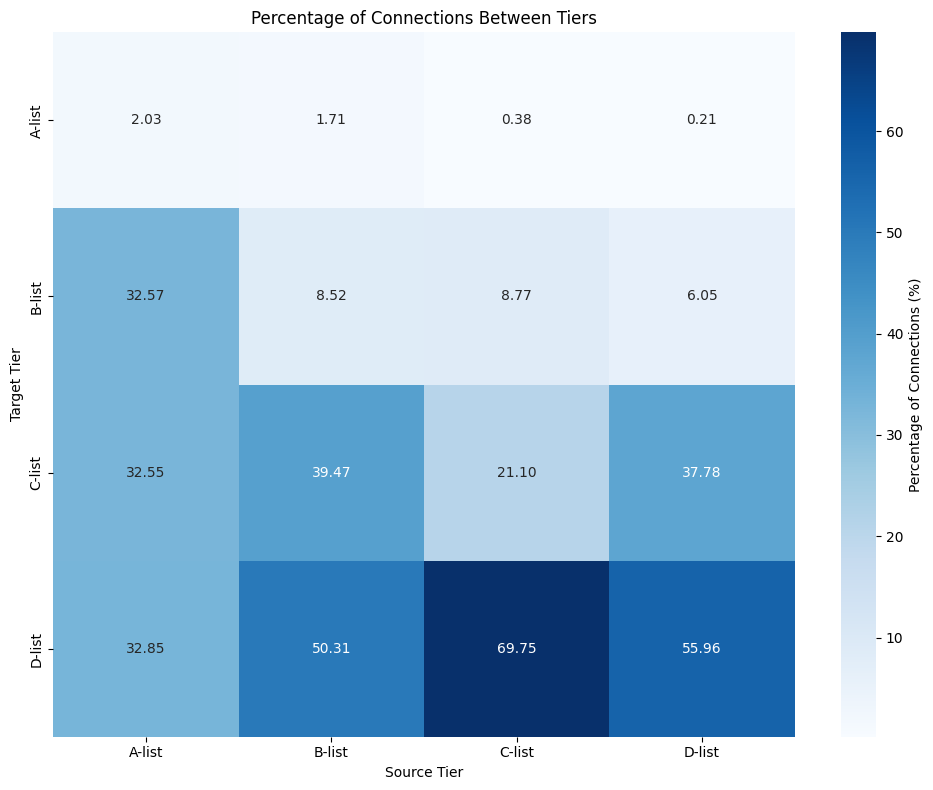

In [19]:
from collections import defaultdict
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize a dictionary to store connections between tiers
tier_connections = defaultdict(lambda: defaultdict(int))

# Iterate through all edges in the graph
for node1, node2 in G_collabs.edges():
    # Get the tiers of the two connected nodes
    tier1 = centrality_df.loc[node1, 'tier_label_comb'] if node1 in centrality_df.index else 'Unknown'
    tier2 = centrality_df.loc[node2, 'tier_label_comb'] if node2 in centrality_df.index else 'Unknown'
    
    # Increment the connection count for the tier pair
    tier_connections[tier1][tier2] += 1
    if tier1 != tier2:
        tier_connections[tier2][tier1] += 1  # Count the reverse connection as well

# Calculate tier sizes
tier_sizes = centrality_df['tier_label_comb'].value_counts().to_dict()
tier_percentages = defaultdict(lambda: defaultdict(float))

# Calculate percentages and display results
for tier1 in sorted(tier_connections.keys()):
    total_connections = sum(tier_connections[tier1].values())
    print(f"Tier {tier1} connections:")
    for tier2, count in tier_connections[tier1].items():
        percentage_of_tier1 = (count / total_connections) * 100 if total_connections > 0 else 0
        tier_percentages[tier1][tier2] = percentage_of_tier1
        print(f"  To Tier {tier2}: {count} connections ({percentage_of_tier1:.2f}%)")
    print()

# Convert to a DataFrame for visualization
tier_percentages_df = pd.DataFrame(tier_percentages).fillna(0)
tier_order = ['A-list', 'B-list', 'C-list', 'D-list']
tier_percentages_df = tier_percentages_df.reindex(index=tier_order, columns=tier_order, fill_value=0)#.T
print(tier_percentages_df)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(tier_percentages_df, annot=True, fmt=".2f", cmap="Blues", cbar_kws={'label': 'Percentage of Connections (%)'})
plt.title("Percentage of Connections Between Tiers")
plt.xlabel("Source Tier")
plt.ylabel("Target Tier")
plt.tight_layout()
plt.show()

The next cell shows statistics about different tiers of actors based on PageRank, Eigenvector centrality and their combination, including average metrics and sample actors for each tier.

In [20]:
for tier in sorted(centrality_df['tier_label_pr'].unique()):
    sub = centrality_df[centrality_df['tier_label_pr'] == tier]
    print(f"Tier based on PageRank {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

print('-------------------------------------')
for tier in sorted(centrality_df['tier_label_ev'].unique()):
    sub = centrality_df[centrality_df['tier_label_ev'] == tier]
    print(f"Tier based on Eigenvector {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

print('-------------------------------------')
for tier in sorted(centrality_df['tier_label_comb'].unique()):
    sub = centrality_df[centrality_df['tier_label_comb'] == tier]
    print(f"Tier based PageRank & Eigenvector {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

Tier based on PageRank A-list:
  Avg PageRank: 2.89e-05
  Avg Eigenvector: 0.0057499
  Avg Page + Eigen: 0.0548
  Avg Nr of Degrees: 224.95
  Median Nr of Degrees: 210.5
  Nr of actors/actresses: 1098
  Sample actors: ['John Rhys-Davies', 'Rutger Hauer', 'Linnea Quigley', 'Robert Miano', 'Edward Asner']
Tier based on PageRank B-list:
  Avg PageRank: 1.27e-05
  Avg Eigenvector: 0.0009039
  Avg Page + Eigen: 0.0207
  Avg Nr of Degrees: 93.98
  Median Nr of Degrees: 88.0
  Nr of actors/actresses: 8794
  Sample actors: ['Néstor Cantillana', 'Sergio Hernández', 'Peter Bogdanovich', 'Norman Foster', 'Jaime Vadell']
Tier based on PageRank C-list:
  Avg PageRank: 5.6e-06
  Avg Eigenvector: 0.0001894
  Avg Page + Eigen: 0.0083
  Avg Nr of Degrees: 32.87
  Median Nr of Degrees: 27.0
  Nr of actors/actresses: 41274
  Sample actors: ['Luis Alarcón', 'Marcial Edwards', 'Louise Fletcher', 'Charlie Sheen', 'Mauricio Pesutic']
Tier based on PageRank D-list:
  Avg PageRank: 2.4e-06
  Avg Eigenvector: 2

The following cell returns a sample of three actors from each tier. This is used for a final report.

In [21]:
print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'A-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'B-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'C-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'D-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

Index(['Vennela Kishore', 'Eric Roberts', 'Tanikella Bharani'], dtype='object')
Index(['Kota Srinivasa Rao', 'Rajeev Kanakala', 'Kajal Aggarwal'], dtype='object')
Index(['Jon Lovitz', 'Daniel Antivilo', 'Kristen Stewart'], dtype='object')
Index(['James C. Morris', 'Bas Keijzer', 'Felicia Greenfield'], dtype='object')


The following figure shows Eric Roberts' ego network - all actors he has directly collaborated with, colored by their tier status (A-list to D-list) and with edge weights representing number of collaborations. Eric Roberts is shown in the middle with a yellow node.

PS! We suggest opening this in a separate window (if you are using VSCode) and zoom in.

Number of nodes in the graph: 2134


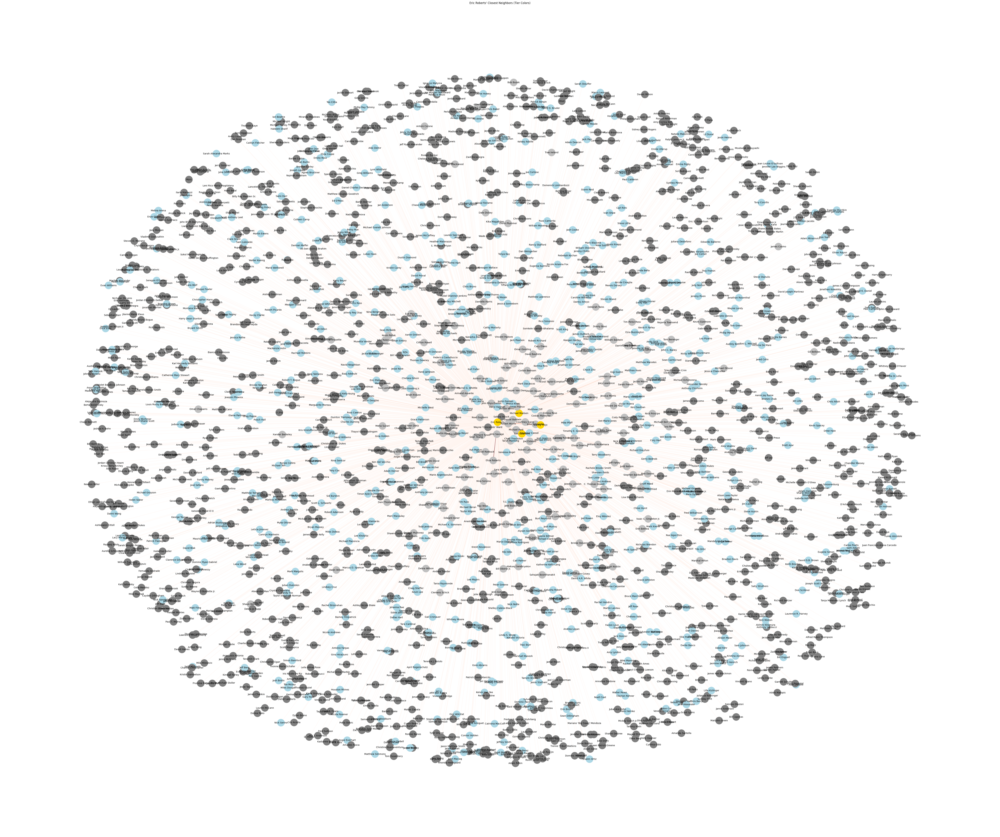

In [22]:
import matplotlib.pyplot as plt

eric_roberts_node = centrality_df[centrality_df['name'] == 'Eric Roberts'].index[0]
# Get the ego graph for Eric Roberts with immediate neighbors
ego_graph = nx.ego_graph(G_collabs, eric_roberts_node, radius=1, center=True, undirected=True)

# Filter edges to include only those connected to Eric Roberts
filtered_edges = [(eric_roberts_node, neighbor) for neighbor in ego_graph.neighbors(eric_roberts_node)]
filtered_weights = [ego_graph[eric_roberts_node][neighbor]['weight'] for neighbor in ego_graph.neighbors(eric_roberts_node)]


plt.figure(figsize=(60, 50))
pos = nx.spring_layout(ego_graph, k=0.5, seed=42, weight='weight')
# Define a color map for tiers
tier_colors = {
    'A-list': 'gold',
    'B-list': 'silver',
    'C-list': 'lightblue',
    'D-list': 'gray'
}
# Get the tier for each node
node_colors = [
    tier_colors[centrality_df.loc[node, 'tier_label_comb']]
    if node in centrality_df.index else 'gray'
    for node in ego_graph.nodes()
]
options = {
    "node_color": node_colors,
    "edge_color": filtered_weights,
    "edgelist": filtered_edges,
    "edge_cmap": plt.cm.Reds,
    "with_labels": True,
    "labels": {n: G_collabs.nodes[n]['name'] for n in ego_graph.nodes()},
    "node_size": 1000,
    "font_size": 10
}
print(f"Number of nodes in the graph: {ego_graph.number_of_nodes()}")
nx.draw(ego_graph, pos, **options)
plt.title("Eric Roberts' Closest Neighbors (Tier Colors)")
plt.show()

We can also take a random actor and see their centrality metrics and tier labels. The following example shows these bits of information about Bill Barretta.

In [23]:
actor_name = 'Bill Barretta'
actor_info = centrality_df[centrality_df['name'] == actor_name]
actor_info[['pagerank', 'eigenvector', 'degree', 'tier_label_pr', 'tier_label_ev', 'tier_label_comb']]

,pagerank,eigenvector,degree,tier_label_pr,tier_label_ev,tier_label_comb
Bill Barretta,0.000004,0.000002,21,D-list,D-list,D-list


Here we define a function that returns all movies where the actor appears. An example is shown with Eric Roberts.

In [24]:
def get_movies_by_actor(actor_name, df):
    # Filter rows where the actor appears
    actor_movies = df[df['actor_name'] == actor_name]
    # Select relevant columns (e.g., movie title, average rating, year)
    return actor_movies[['movie_title', 'average_rating', 'start_year']].drop_duplicates()

# Example usage
actor_name = "Eric Roberts"
movies = get_movies_by_actor(actor_name, df)
print(f"Movies of {actor_name}:")
movies

Movies of Eric Roberts:


,movie_title,average_rating,start_year
8551,Here's Yianni!,8.8,2024
14005,"Charlie, Trevor and a Girl Savannah",8.5,2015
17900,The Wrath,8.4,2015
21650,1959,8.3,2016
24563,Desert Fiends,8.2,2024
...,...,...,...
730115,Joker's Poltergeist,1.9,2016
730258,Red Prophecies,1.9,2021
730283,Dirty Fears,1.9,2020
732075,Space Sharks,1.5,2024


Below we define a function that returns all movies where two actors appear together. An example is shown with Eric Roberts and John Schneider.

In [25]:
def get_movies_by_actor_pair(actor1, actor2, df):
    # Filter rows where both actors appear in the same movie
    movies_together = df[df['actor_name'].isin([actor1, actor2])]
    movies_together = movies_together.groupby('tconst').filter(lambda x: len(x['actor_name'].unique()) > 1)
    return movies_together[['tconst', 'movie_title', 'average_rating']].drop_duplicates()

# Example usage
actor1 = "Eric Roberts"
actor2 = "John Schneider"
# Get movies where both actors appeared together
movies = get_movies_by_actor_pair(actor1, actor2, df)
print(movies)

           tconst           movie_title  average_rating
440883  tt2459160      Road to the Open             5.6
655692  tt5079608  You're Gonna Miss Me             3.9
676135  tt2897102     Let the Lion Roar             3.6


The next cell prepares data for visualization by creating two CSV files:
1. edges.csv - Contains filtered edges with their weights in format: source;target;value
2. nodes.csv - Contains node information including ID, name and category (tier label)

This data is used to create a visualization of Eric Roberts' ego network

In [26]:
edge_rows = []

for i in range(len(filtered_edges)):
    u, v = filtered_edges[i]
    value = filtered_weights[i]
    edge_rows.append(f"{u};{v};{value}")

with open("edges.csv", "w", encoding="utf-8") as f:
    f.write("source;target;value\n")
    f.write("\n".join(edge_rows))

node_rows = []

for node, data in ego_graph.nodes(data=True):
    category = data.get('tier_label_comb')
    name = data.get('name')
    node_rows.append(f"{node};{name};{category}")

with open("nodes.csv", "w", encoding="utf-8") as f:
    f.write("id;name;category\n")
    f.write("\n".join(node_rows))

...and here we show a visualization of Eric Roberts' ego network.

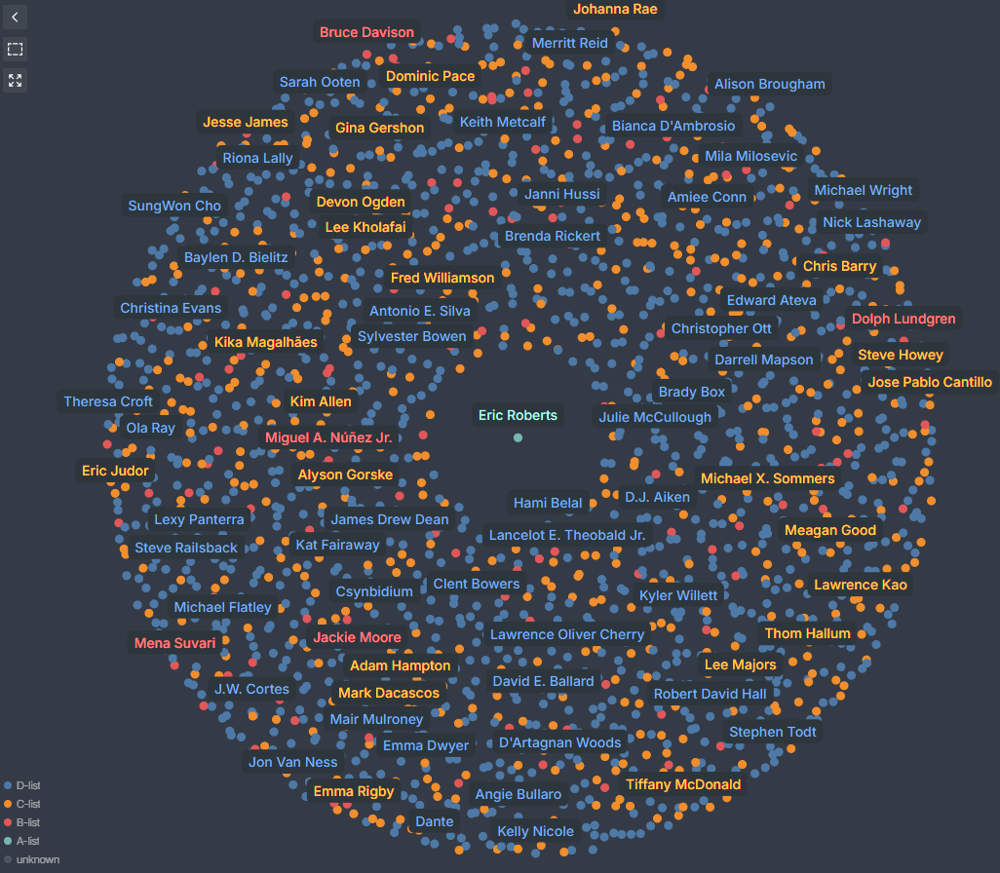

In [27]:
from IPython.display import Image
Image(filename='eric roberts ego graph.png')

## Star power graph
We create a new graph G_starPower that represents collaborations between actors. For each movie, we create edges between all pairs of actors who appeared in it. The edge weight is calculated as (movie rating * number of votes) to capture both quality and popularity. We also track the number of movies each pair has collaborated on.

In [28]:
import networkx as nx
from itertools import combinations

G_starPower = nx.Graph()

for tconst, group in df.groupby('tconst'):
    actors = group['actor_name'].tolist()
    avg_rating = group['average_rating'].iloc[0]
    num_votes = group['num_votes'].iloc[0] 
    for actor1, actor2 in combinations(actors, 2):
        if actor1 == actor2:
            continue
        # Add nodes excplicitly to add name attributes
        if not G_starPower.has_node(actor1):
            G_starPower.add_node(actor1, name=actor1)
        if not G_starPower.has_node(actor2):
            G_starPower.add_node(actor2, name=actor2)
        # Add edge with weight
        if G_starPower.has_edge(actor1, actor2):
            # Update total weighted rating and movie count
            G_starPower[actor1][actor2]['movie_count'] += 1
            # Update the weighted average rating
            G_starPower[actor1][actor2]['weight'] += avg_rating * num_votes
        else:
             # Initialize edge attributes
            G_starPower.add_edge(
                actor1, actor2,
                movie_count=1,
                weight=avg_rating * num_votes 
            )

Calculate PageRank and eigenvector centrality measures for the star power graph.

In [29]:
pagerank = nx.pagerank(G_starPower, weight='weight')
nx.set_node_attributes(G_starPower, pagerank, name='pagerank')

eigen_centrality = nx.eigenvector_centrality(G_starPower, max_iter=1000, weight='weight')
nx.set_node_attributes(G_starPower, eigen_centrality, name='eigen_centrality')

In the next cell, we:
1. Create a dataframe with PageRank and eigenvector centrality measures
2. Scale PageRank and eigenvector centrality values to [0,0.5] range and combine them
3. Add node degree (number of connections) to the dataframe
4. Perform K-means clustering (k=4) separately on:
   - PageRank values
   - Eigenvector centrality values 
   - Combined scaled PageRank + eigenvector values
5. Map the clusters to meaningful labels (A-list through D-list) based on centrality means
6. Add the tier labels as node attributes to the graph

In [30]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

centrality_df = pd.DataFrame.from_dict(pagerank, orient='index', columns=['pagerank'])
centrality_df['eigenvector'] = pd.Series(eigen_centrality)
# Scale pagerank to range [0, 0.5]
pagerank_scaler = MinMaxScaler(feature_range=(0, 0.5))
centrality_df['pagerank_scaled'] = pagerank_scaler.fit_transform(centrality_df[['pagerank']])
# Scale eigenvector centrality to range [0, 0.5]
eigenvector_scaler = MinMaxScaler(feature_range=(0, 0.5))
centrality_df['eigenvector_scaled'] = eigenvector_scaler.fit_transform(centrality_df[['eigenvector']])
# Combine scaled pagerank and eigenvector centrality
centrality_df['page_plus_eigen_scaled'] = centrality_df['pagerank_scaled'] + centrality_df['eigenvector_scaled']

degree_dict = dict(G_starPower.degree())  # Unweighted degree — just the number of neighbors
centrality_df['degree'] = pd.Series(degree_dict)

scaler = StandardScaler()
# KMEANS clustering on pagerank
X = scaler.fit_transform(centrality_df[['pagerank']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_page'] = kmeans.fit_predict(X)

# KMEANS clustering on eigenvector centrality
scaler = StandardScaler()
X = scaler.fit_transform(centrality_df[['eigenvector']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_eigen'] = kmeans.fit_predict(X)

#KMEANS clustering on pagerank + eigenvector centrality
scaler = StandardScaler()
X = scaler.fit_transform(centrality_df[['page_plus_eigen_scaled']])
kmeans = KMeans(n_clusters=4, random_state=42)
centrality_df['tier_combined'] = kmeans.fit_predict(X)

# Map sorted cluster index to labels to have meaningful names
labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_page')['pagerank'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_pr'] = centrality_df['tier_page'].map(tier_to_label)
nx.set_node_attributes(G_starPower, centrality_df['tier_label_pr'].to_dict(), name='tier_label_pr')

labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_eigen')['eigenvector'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_ev'] = centrality_df['tier_eigen'].map(tier_to_label)
nx.set_node_attributes(G_starPower, centrality_df['tier_label_ev'].to_dict(), name='tier_label_ev')

labels = ['A-list', 'B-list', 'C-list', 'D-list']
tier_means = centrality_df.groupby('tier_combined')['page_plus_eigen_scaled'].mean().sort_values(ascending=False)
tier_to_label = {tier: label for tier, label in zip(tier_means.index, labels)}

centrality_df['tier_label_comb'] = centrality_df['tier_combined'].map(tier_to_label)
nx.set_node_attributes(G_starPower, centrality_df['tier_label_comb'].to_dict(), name='tier_label_comb')

The next cell shows the average movie ratings by actor tier.

In [31]:
# Merge the centrality_df with the original df to include average_rating
df_with_tiers = df.copy().merge(centrality_df[['tier_label_comb']], left_on='actor_name', right_index=True, how='inner')

# Group by tier and calculate the average rating
tier_avg_rating = df_with_tiers.groupby('tier_label_comb')['average_rating'].mean()

# Print the average rating for each tier
print("Average rating by tier:")
print(tier_avg_rating)

Average rating by tier:
tier_label_comb
A-list    5.882396
B-list    5.825559
C-list    5.731183
D-list    5.818810
Name: average_rating, dtype: float32


The next cell shows detailed statistics for each tier, including average PageRank, eigenvector centrality, combined scores, degrees, and sample actors in each tier.

In [32]:
centrality_df['name'] = centrality_df.index.map(lambda node: G_starPower.nodes[node]['name'])

for tier in sorted(centrality_df['tier_label_pr'].unique()):
    sub = centrality_df[centrality_df['tier_label_pr'] == tier]
    print(f"Tier based on PageRank {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

print('-------------------------------------')
for tier in sorted(centrality_df['tier_label_ev'].unique()):
    sub = centrality_df[centrality_df['tier_label_ev'] == tier]
    print(f"Tier based on Eigenvector {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

print('-------------------------------------')
for tier in sorted(centrality_df['tier_label_comb'].unique()):
    sub = centrality_df[centrality_df['tier_label_comb'] == tier]
    print(f"Tier based PageRank & Eigenvector {tier}:")
    print("  Avg PageRank:", round(sub['pagerank'].mean(), 7))
    print("  Avg Eigenvector:", round(sub['eigenvector'].mean(), 7))
    print("  Avg Page + Eigen:", round(sub['page_plus_eigen_scaled'].mean(), 4))
    print("  Median Nr of Degrees:", round(sub['degree'].median(), 2))
    print("  Avg Nr of Degrees:", round(sub['degree'].mean(), 2))
    print("  Nr of actors/actresses:", len(sub))
    print("  Sample actors:", [a for a in sub['name'].head(5)])

Tier based on PageRank A-list:
  Avg PageRank: 4.52e-05
  Avg Eigenvector: 0.0073663
  Avg Page + Eigen: 0.0937
  Avg Nr of Degrees: 227.36
  Median Nr of Degrees: 209.0
  Nr of actors/actresses: 867
  Sample actors: ['John Rhys-Davies', 'Laura Dern', 'Rutger Hauer', 'Linnea Quigley', 'Robert Miano']
Tier based on PageRank B-list:
  Avg PageRank: 1.77e-05
  Avg Eigenvector: 0.0004221
  Avg Page + Eigen: 0.0327
  Avg Nr of Degrees: 109.53
  Median Nr of Degrees: 102.0
  Nr of actors/actresses: 5698
  Sample actors: ['Néstor Cantillana', 'Sergio Hernández', 'Jaime Vadell', 'George Clooney', 'Francisco Reyes']
Tier based on PageRank C-list:
  Avg PageRank: 6.7e-06
  Avg Eigenvector: 3.12e-05
  Avg Page + Eigen: 0.0116
  Avg Nr of Degrees: 37.79
  Median Nr of Degrees: 34.0
  Nr of actors/actresses: 35017
  Sample actors: ['Luis Alarcón', 'Peter Bogdanovich', 'Norman Foster', 'Marcial Edwards', 'Louise Fletcher']
Tier based on PageRank D-list:
  Avg PageRank: 2.3e-06
  Avg Eigenvector: 1.4

The next cell identifies top actors per tier. This is used for the poster.

In [33]:
print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'A-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'B-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'C-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

print(centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'D-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(3).index)

Index(['Scarlett Johansson', 'Chris Evans', 'Chris Hemsworth'], dtype='object')
Index(['John Savage', 'Pierce Brosnan', 'Jackie Earle Haley'], dtype='object')
Index(['Anna Friel', 'Jack Quaid', 'David Krumholtz'], dtype='object')
Index(['André Gonçalves', 'François Brunet', 'Demingo Graham'], dtype='object')


The next cell creates a visualization showing the top 5 A-list actors and their connections to other actors they've worked with. The visualization uses different colors to distinguish actor tiers (A-list = gold, B-list = silver, etc) and edge weights to show collaboration strength. This helps illustrate the interconnected nature of Hollywood's elite actors and their spheres of influence in the industry.

Top A-list actor: pagerank                            0.000076
eigenvector                         0.354664
pagerank_scaled                     0.141048
eigenvector_scaled                       0.5
page_plus_eigen_scaled              0.641048
degree                                   198
tier_page                                  2
tier_eigen                                 1
tier_combined                              2
tier_label_pr                         A-list
tier_label_ev                         A-list
tier_label_comb                       A-list
name                      Scarlett Johansson
Name: Scarlett Johansson, dtype: object


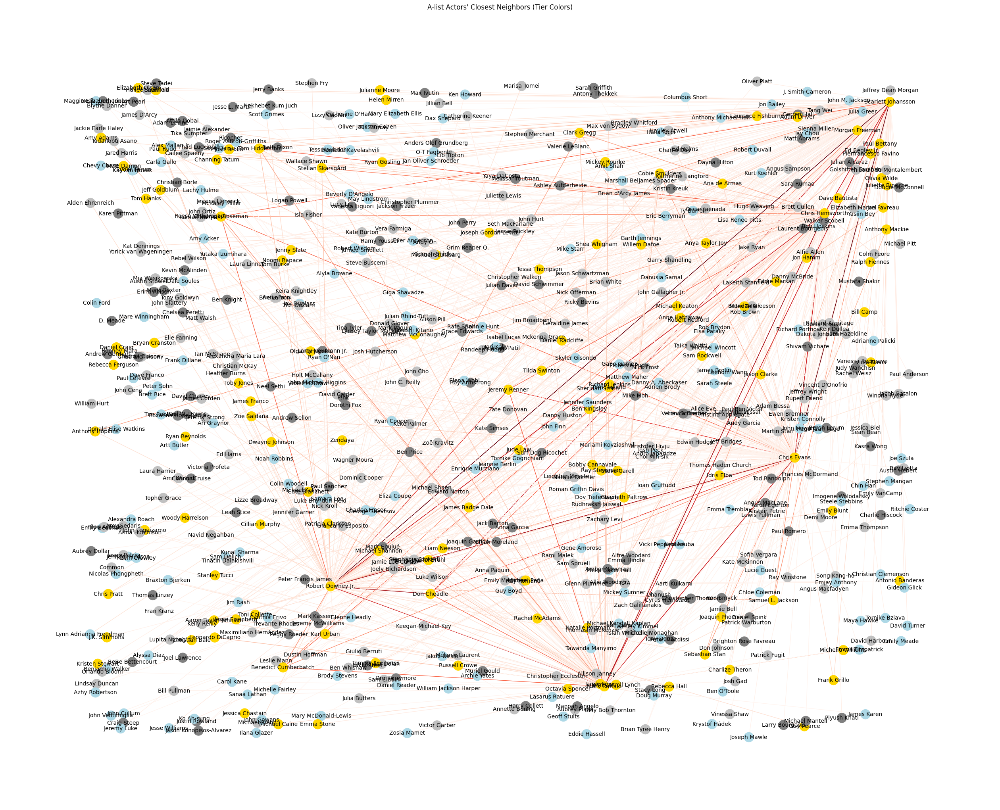

In [34]:
import matplotlib.pyplot as plt

top_a_list_actors_comb = centrality_df.loc[
    (centrality_df['tier_label_comb'] == 'A-list')
].sort_values('page_plus_eigen_scaled', ascending=False).head(5).index
print(f"Top A-list actor: {centrality_df.loc[top_a_list_actors_comb[0]]}")
# Expand the subgraph to include all neighbors of the top A-list actors
expanded_nodes = set()
filtered_edges = []
filtered_weights = []

for actor in top_a_list_actors_comb:
    ego_graph = nx.ego_graph(G_starPower, actor, radius=1, center=True, undirected=True)
    expanded_nodes.update(ego_graph.nodes)
    # Filter edges to include only those connected to the top A-list actors
    for neighbor in ego_graph.neighbors(actor):
        filtered_edges.append((actor, neighbor))
        filtered_weights.append(ego_graph[actor][neighbor]['weight'])

# Create a subgraph with the expanded nodes
H = G_starPower.copy().subgraph(expanded_nodes)


plt.figure(figsize=(25, 20))
pos = nx.random_layout(H, seed=42)
# Define a color map for tiers
tier_colors = {
    'A-list': 'gold',
    'B-list': 'silver',
    'C-list': 'lightblue',
    'D-list': 'gray'
}
# Get the tier for each node
node_colors = [
    tier_colors[centrality_df.loc[node, 'tier_label_comb']]
    if node in centrality_df.index else 'gray'
    for node in H.nodes()
]
options = {
    "node_color": node_colors,
    "edge_color": filtered_weights,
    "edgelist": filtered_edges,
    "edge_cmap": plt.cm.Reds,
    "with_labels": True,
    "labels": {n: G_starPower.nodes[n]['name'] for n in H.nodes()},
    "font_size": 10
}
nx.draw(H, pos, **options)
plt.title("A-list Actors' Closest Neighbors (Tier Colors)")
plt.show()


The code below exports the network data to CSV files that can be used by visualization tools like Gephi or D3.js to create interactive network graphs.

In [35]:
# Saving edges and nodes to CSV files for visualization
edge_rows = []

for i in range(len(filtered_edges)):
    u, v = filtered_edges[i]
    value = filtered_weights[i] 
    edge_rows.append(f"{u};{v};{value}")

with open("edges.csv", "w", encoding="utf-8") as f:
    f.write("source;target;value\n")
    f.write("\n".join(edge_rows))

node_rows = []

for node, data in H.nodes(data=True):
    category = data.get('tier_label_comb')
    name = data.get('name')
    node_rows.append(f"{node};{name};{category}")

with open("nodes.csv", "w", encoding="utf-8") as f:
    f.write("id;name;category\n")
    f.write("\n".join(node_rows))

The image below shows a visualization of the top 5 actors' network graph, highlighting their connections and collaborations. The graph was exported using the code above and visualized using external tools to create a more polished and interactive representation of the star power network.

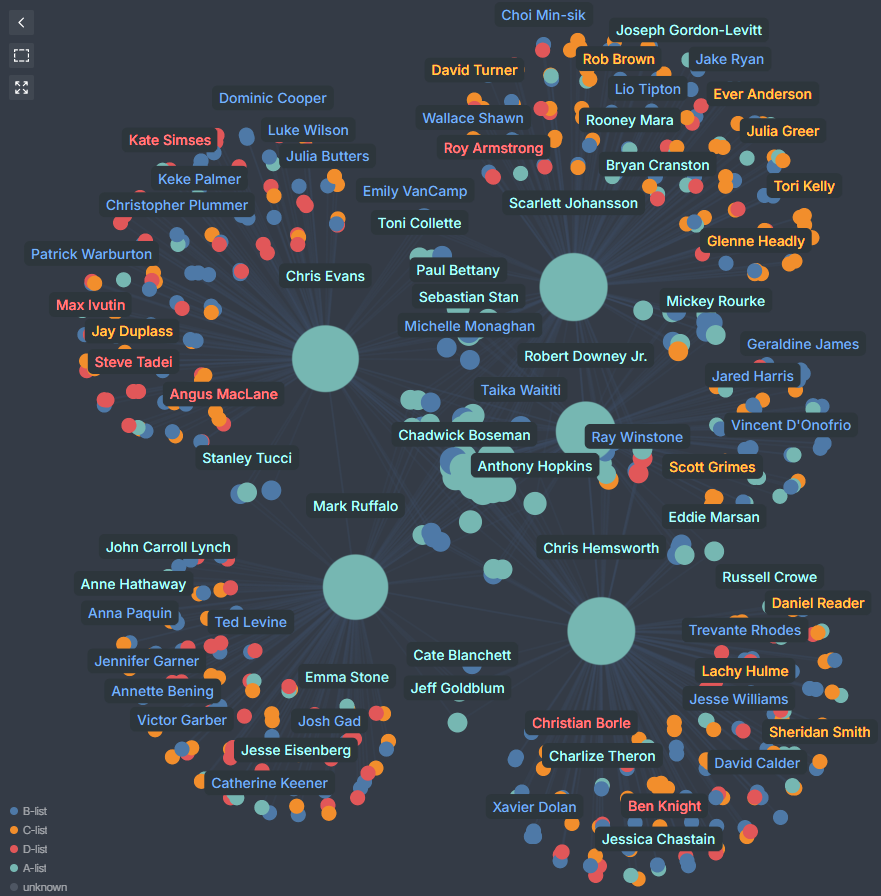

In [36]:
from IPython.display import Image
Image(filename='star power top5 graph.PNG')

The cell below analyzes actor ratings, finding the actor with the highest average movie rating and their tier classification based on PageRank and Eigenvector centrality measures. This helps us understand if there's any correlation between an actor's network position (tier) and the quality of movies they appear in.

In [37]:
# Group by actor_name and calculate the average rating
actor_avg_ratings = df.groupby('actor_name')['average_rating'].mean()

# Find the actor with the maximum average rating
max_rating_actor = actor_avg_ratings.idxmax()  # Actor with the highest average rating
max_rating = actor_avg_ratings.max()  # Maximum average rating

print(f"Actor with the highest average rating: {max_rating_actor} ({max_rating:.2f}), nr of movies: {len(df[df['actor_name'] == max_rating_actor])}")
print(f"Actor's tier based on PageRank and Eigenvector: {centrality_df.loc[max_rating_actor, 'tier_label_comb']}")

Actor with the highest average rating: Alex Bauman (10.00), nr of movies: 1
Actor's tier based on PageRank and Eigenvector: D-list


Obviously an average of 10.00 does not reflect anything if it's based on one movie and that movie does not have many voters.

Let's analyze a well-known actor like Scarlett Johansson to get a more meaningful example. The next cell calculates her average movie rating and total number of movies in our dataset.

In [38]:
def get_actor_average_rating(actor_name, df):
    # Filter the DataFrame for movies where the actor appears
    actor_movies = df[df['actor_name'] == actor_name]
    
    # Calculate the average rating
    avg_rating = actor_movies['average_rating'].mean()
    
    # Count the number of movies
    num_movies = actor_movies['tconst'].nunique() 
    
    return avg_rating, num_movies

actor_name = "Scarlett Johansson"
avg_rating, num_movies = get_actor_average_rating(actor_name, df)

print(f"Average rating of movies for {actor_name}: {avg_rating:.2f}")
print(f"Number of movies for {actor_name}: {num_movies}")

Average rating of movies for Scarlett Johansson: 7.07
Number of movies for Scarlett Johansson: 27


## Bipartite graph between actors and genres
In the next cell, we create a bipartite graph between actors and genres. Each actor is connected to the genres of movies they appeared in. The edges contain information about the movies that connect an actor to a genre, including ratings and vote counts. The edge weights are calculated based on the movie ratings, number of votes, and number of movies connecting the actor to that genre.

In [39]:
import networkx as nx

# Create a bipartite graph
B = nx.Graph()

# Iterate through the DataFrame to add nodes and edges
for _, row in df.iterrows():
    actor = row['actor_name']
    genres = row['genres']
    movie_title = row['movie_title']
    avg_rating = row['average_rating']
    num_votes = row['num_votes']
    
    # Add actor node (part of set 0)
    if not B.has_node(actor):
        B.add_node(actor, bipartite=0, type='actor')  # Add type attribute for clarity
    
    # Add genre nodes (part of set 1) and edges
    for genre in genres:
        if not B.has_node(genre):
            B.add_node(genre, bipartite=1, type='genre')  # Add type attribute for clarity
        
        # Add edge between actor and genre with movie attributes
        if not B.has_edge(actor, genre):
            B.add_edge(actor, genre, movies=[movie_title], total_rating=avg_rating, total_votes=num_votes, weight=avg_rating * num_votes)
        else:
            # Update edge attributes if the edge already exists
            B[actor][genre]['movies'].append(movie_title)
            B[actor][genre]['total_rating'] += avg_rating
            B[actor][genre]['total_votes'] += num_votes
            B[actor][genre]['weight'] = B[actor][genre]['total_rating'] * B[actor][genre]['total_votes'] * len(B[actor][genre]['movies'])

print(f"Number of nodes: {B.number_of_nodes()}")
print(f"Number of edges: {B.number_of_edges()}")

Number of nodes: 315275
Number of edges: 841886


In the cell below, we analyze the actors' genre diversity and identify:
1. The top 5 actors who appear in the most different genres (most versatile)
2. The top 5 actors who appear in the fewest genres (most specialized)

We only consider actors who have appeared in more than 5 movies to filter out one-time appearances.

In [40]:
actor_movie_counts = df.groupby('actor_name')['tconst'].nunique()  # Count unique movies per actor
actors_with_multiple_movies = actor_movie_counts[actor_movie_counts > 5].index  # Get actors with more than 5 movie

# Filter the bipartite graph to include only these actors
filtered_B = B.copy().subgraph([node for node in B.nodes if B.nodes[node]['type'] == 'genre' or node in actors_with_multiple_movies])

# Filter actor nodes (bipartite=0) and calculate their degree (connections to genres)
actor_genre_degrees = {
    node: len([neighbor for neighbor in filtered_B.neighbors(node) if filtered_B.nodes[neighbor]['type'] == 'genre'])
    for node, data in filtered_B.nodes(data=True) if data['type'] == 'actor'
}

# Sort actors by the number of genre connections
sorted_actor_genre_degrees = sorted(actor_genre_degrees.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 actors with the most genre connections
top_5_most_genres = sorted_actor_genre_degrees[:5]

# Get the top 5 actors with the least genre connections
top_5_least_genres = sorted_actor_genre_degrees[-5:]

print("Top 5 actors with the most genre connections:")
for actor, count in top_5_most_genres:
    print(f"{actor}: {count} genres")

print("\nTop 5 actors with the least genre connections:")
for actor, count in top_5_least_genres:
    print(f"{actor}: {count} genres")

Top 5 actors with the most genre connections:
Danny Glover: 20 genres
Eric Roberts: 20 genres
Forest Whitaker: 20 genres
Melissa Leo: 20 genres
Michael Peña: 20 genres

Top 5 actors with the least genre connections:
Ha Seong-guk: 1 genres
Jenn Rosa: 1 genres
Mohammad Heidari: 1 genres
Krsy Fox: 1 genres
Evelyn Vargas: 1 genres


Next, we analyze the average ratings of actors across all genres to identify:
1. The top 5 highest-rated actors overall
2. The top 5 lowest-rated actors overall
 
We use a weighted average rating that takes into account both the rating and number of votes to give more weight to movies with more reviews.

In [41]:
#df.drop(columns=['weighted_avg_rating'], inplace=True)
df['weighted_avg_rating'] = df['average_rating'] * df['num_votes']  # Weighted rating
# Calculate the average weighted rating for each actor
actor_avg_ratings = df.groupby('actor_name')[['weighted_avg_rating', 'average_rating']].mean()
# Sort actors by their average rating in descending order
sorted_actor_avg_ratings = actor_avg_ratings.sort_values(by='weighted_avg_rating', ascending=False)['average_rating']
# Get the top 5 highest-rated actors
top_5_highest_rated_actors = sorted_actor_avg_ratings.head(5)

print("Top 5 highest-rated actors across all genres:")
for actor, avg_rating in top_5_highest_rated_actors.items():
    print(f"{actor}: {avg_rating:.2f}")

print("\nTop 5 lowest-rated actors across all genres:")
for actor, avg_rating in sorted_actor_avg_ratings[-5:].items():
    print(f"{actor}: {avg_rating:.2f}")

Top 5 highest-rated actors across all genres:
Pete Postlethwaite: 8.15
Francis X. McCarthy: 7.40
Style Dayne: 8.00
Max Kasch: 8.50
Absa Diatou Toure: 8.50

Top 5 lowest-rated actors across all genres:
Madison White: 1.30
Carter Nelms: 1.30
Kaylee Keller: 1.30
Brian Scott Gilmore: 1.30
Zach Graham: 1.30


Next, we analyze the best and worst performing genres for specific actors.

For each actor, we:
1. Calculate the average rating of their movies in each genre
2. Identify their highest and lowest rated genres

This helps us understand which genres each actor performs best and worst in.

In [42]:
def get_actor_best_and_worst_genres(actor_name, df):
    # Filter the DataFrame for movies where the actor appears
    actor_movies = df[df['actor_name'] == actor_name]
    
    # Dictionary to store average ratings for each genre
    genre_ratings = defaultdict(list)
    
    # Iterate through the actor's movies and collect ratings for each genre
    for _, row in actor_movies.iterrows():
        genres = row['genres']
        for genre in genres:
            genre_ratings[genre].append(row['average_rating'])
    
    # Calculate the average rating for each genre
    avg_genre_ratings = {genre: sum(ratings) / len(ratings) for genre, ratings in genre_ratings.items()}
    
    # Find the best and worst genres
    best_genre = max(avg_genre_ratings, key=avg_genre_ratings.get)
    worst_genre = min(avg_genre_ratings, key=avg_genre_ratings.get)
    
    return best_genre, avg_genre_ratings[best_genre], worst_genre, avg_genre_ratings[worst_genre]

actor_name = "Scarlett Johansson"
best_genre, best_rating, worst_genre, worst_rating = get_actor_best_and_worst_genres(actor_name, df)

print(f"Best genre for {actor_name}: {best_genre} ({best_rating:.2f})")
print(f"Worst genre for {actor_name}: {worst_genre} ({worst_rating:.2f})")

Best genre for Scarlett Johansson: War (7.90)
Worst genre for Scarlett Johansson: Crime (6.30)


The following plot shows the distribution of how many different genres actors work in.

The x-axis shows the number of unique genres an actor has worked in, while the y-axis shows what percentage of actors have worked in that many genres. For example, we can see that around 35% of actors have worked in 3 different genres, making this the most common number of genre connections. The distribution shows that most actors tend to work in 2-4 different genres, with fewer actors working across a very wide or very narrow range of genres.

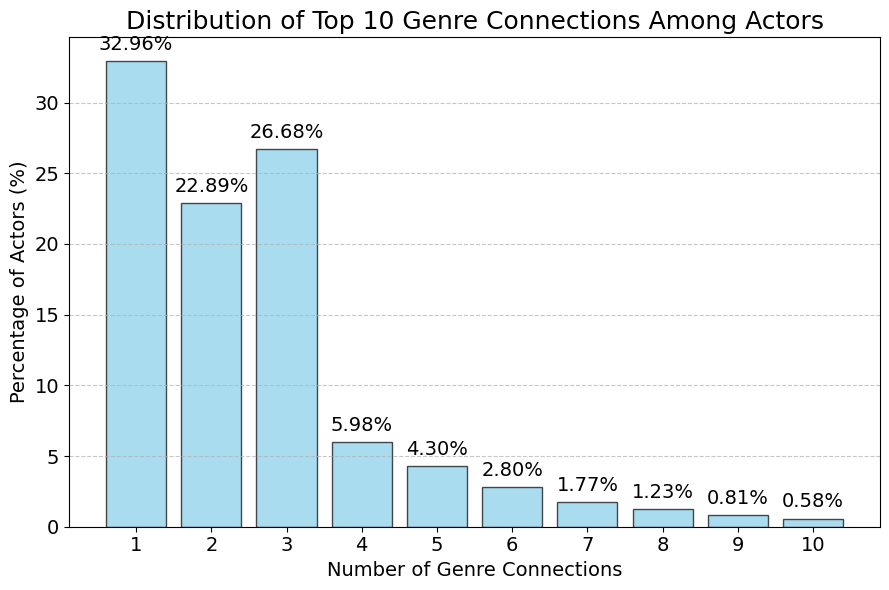

In [43]:
import matplotlib.pyplot as plt
from collections import Counter

actor_movie_counts = df.groupby('actor_name')['tconst'].nunique()  # Count unique movies per actor

filtered_B = B.copy().subgraph([node for node in B.nodes if B.nodes[node]['type'] == 'genre' or node in actor_movie_counts])
actor_genre_degrees = {
    node: len([neighbor for neighbor in filtered_B.neighbors(node) if filtered_B.nodes[neighbor]['type'] == 'genre'])
    for node, data in filtered_B.nodes(data=True) if data['type'] == 'actor'
}
# Count the frequency of genre connections
genre_connection_counts = Counter(actor_genre_degrees.values())

# Sort the counts by the number of genre connections
sorted_genre_counts = sorted(genre_connection_counts.items(), key=lambda x: x[1], reverse=True)[:10]

# Separate the data for plotting
genre_counts, actor_frequencies = zip(*sorted_genre_counts)
# Calculate percentages
total_actors = sum(actor_frequencies)
actor_percentages = [(freq / total_actors) * 100 for freq in actor_frequencies]

# Plot the bar chart
plt.figure(figsize=(9, 6))
bars = plt.bar(genre_counts, actor_percentages, color='skyblue', edgecolor='black', alpha=0.7)
# Add percentage labels on top of each bar
for bar, percentage in zip(bars, actor_percentages):
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate (center of the bar)
        bar.get_height() + 0.5,            # Y-coordinate (slightly above the bar)
        f"{percentage:.2f}%",             # Text to display
        ha='center', va='bottom', fontsize=14  # Center alignment
    )

plt.title("Distribution of Top 10 Genre Connections Among Actors", fontsize=18)
plt.xlabel("Number of Genre Connections", fontsize=14)
plt.ylabel("Percentage of Actors (%)", fontsize=14)
plt.xticks(range(min(genre_counts), 11), fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

The next cell defines a function that returns all genre names that the actor has worked in by checking their connections in the bipartite graph.

In [44]:
def get_actor_genre_connections(actor_name, graph):
    # Check if the actor exists in the graph
    if actor_name not in graph:
        print(f"Actor '{actor_name}' not found in the graph.")
        return []
    
    # Get all neighbors of the actor and filter for genres
    genre_connections = [neighbor for neighbor in graph.neighbors(actor_name) if graph.nodes[neighbor]['type'] == 'genre']
    
    return genre_connections

actor_name = "Eric Roberts"
genre_connections = get_actor_genre_connections(actor_name, B)

print(f"Genres connected to {actor_name}: {genre_connections}")

Genres connected to Eric Roberts: ['Drama', 'Crime', 'Romance', 'Thriller', 'Mystery', 'Comedy', 'Horror', 'Biography', 'Documentary', 'Action', 'Music', 'Musical', 'Sport', 'Adventure', 'Family', 'History', 'War', 'Fantasy', 'Sci-Fi', 'Western']


The following plot shows the distribution of genres across all movies in the dataset. For each of the top 10 most common genres, it displays what percentage of total genre appearances that genre represents. For example, if a movie has multiple genres like "Drama, Action, Comedy", each of those genres gets counted once. This gives us insight into which genres are most prevalent in the movie dataset overall.

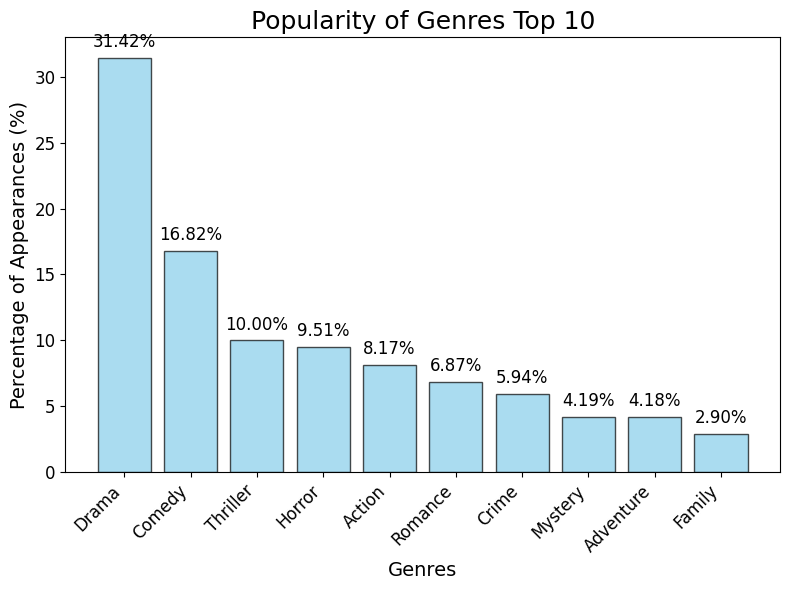

In [45]:
import matplotlib.pyplot as plt
from collections import Counter

# Count the occurrences of each genre
genre_counts = Counter()
for genres in df['genres']:
    genre_counts.update(genres)

# Sort genres by their counts
sorted_genre_counts = sorted(genre_counts.items(), key=lambda x: x[1], reverse=True)[:10]  # Get top 10 genres

# Separate data for plotting
genres, counts = zip(*sorted_genre_counts)
# Calculate percentages
total_genres = sum(counts)
genre_percentages = [(freq / total_genres) * 100 for freq in counts]

# Plot the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(genres, genre_percentages, color='skyblue', edgecolor='black', alpha=0.7)
for bar, percentage in zip(bars, genre_percentages):
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate (center of the bar)
        bar.get_height() + 0.5,            # Y-coordinate (slightly above the bar)
        f"{percentage:.2f}%",             # Text to display
        ha='center', va='bottom', fontsize=12  # Center alignment
    )
plt.title("Popularity of Genres Top 10", fontsize=18)
plt.xlabel("Genres", fontsize=14)
plt.ylabel("Percentage of Appearances (%)", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=12) 
plt.tight_layout()
plt.show()

The next cell analyzes the top 5 actors for each genre based on how many movies they've appeared in within that genre. For each genre in our bipartite graph, it finds the actors with the most connections (movies) to that genre and prints them out in descending order. This helps us identify which actors specialize or are most prolific in particular genres.

In [46]:
genre_nodes = [n for n, d in B.nodes(data=True) if d.get('type') == 'genre']

# For each genre, collect connected actors and their edge weights
top_actors_per_genre = {}

for genre in genre_nodes:
    neighbors = B.neighbors(genre)
    actor_movie_counts = []

    for actor in neighbors:
        edge_data = B.get_edge_data(genre, actor)
        movies = edge_data.get('movies', [])  # Ensure it's a list
        movie_count = len(movies)
        actor_movie_counts.append((actor, movie_count, movies))

    # Sort actors by movie count and get top 5
    top_5 = sorted(actor_movie_counts, key=lambda x: x[1], reverse=True)[:5]
    top_actors_per_genre[genre] = top_5

for genre, actor_info in top_actors_per_genre.items():
    print(f"\n Top 5 actors for genre '{genre}':")
    for actor, count, movies in actor_info:
        print(f"  {actor} — {count} movies")


 Top 5 actors for genre 'Drama':
  Eric Roberts — 97 movies
  Nassar — 61 movies
  Yogi Babu — 58 movies
  Prakash Raj — 56 movies
  Murli Sharma — 50 movies

 Top 5 actors for genre 'Music':
  Eric Roberts — 5 movies
  Brittany Snow — 5 movies
  Imogen Poots — 5 movies
  Eddie Izzard — 5 movies
  Stephen Boss — 5 movies

 Top 5 actors for genre 'Comedy':
  Eric Roberts — 50 movies
  Yogi Babu — 47 movies
  Vennela Kishore — 46 movies
  Richard Riehle — 42 movies
  Danny Trejo — 40 movies

 Top 5 actors for genre 'History':
  Olivier Gourmet — 10 movies
  Chinmay Mandlekar — 8 movies
  Song Kang-ho — 7 movies
  Andrea Riseborough — 7 movies
  Louis Garrel — 7 movies

 Top 5 actors for genre 'Documentary':
  Peter Coyote — 15 movies
  Healthy Emmie — 10 movies
  Martin Sheen — 9 movies
  Liam Neeson — 9 movies
  Susan Sarandon — 8 movies

 Top 5 actors for genre 'Thriller':
  Eric Roberts — 79 movies
  Tom Sizemore — 38 movies
  Michael Paré — 30 movies
  Bruce Willis — 30 movies
  Mic

The cell below finds "niche actors" - actors who specialize heavily in a particular genre. It identifies actors who:
1. Have appeared in more than 10 movies total (to filter out actors with limited filmography)
2. Have at least 75% of their movies in a single genre

The results show each actor's total movie count, their most frequent genre, and what percentage of their movies are in that genre.

In [47]:
def find_niche_actors_with_graph(graph):
    # List to store niche actors
    niche_actors = []

    # Filter actor nodes
    actor_nodes = [node for node, data in graph.nodes(data=True) if data['type'] == 'actor']

    for actor in actor_nodes:
        # Get all genres connected to the actor
        genre_edges = [(genre, graph[actor][genre]) for genre in graph.neighbors(actor) if graph.nodes[genre]['type'] == 'genre']

        # Calculate the total number of movies for the actor
        total_movies = sum(len(edge_data['movies']) for _, edge_data in genre_edges)
        if total_movies <= 10: # to filter out actors with too few movies
            continue
        # Count the number of movies for each genre
        genre_counts = {genre: len(edge_data['movies']) for genre, edge_data in genre_edges}

        # Find the most frequent genre and its count
        most_frequent_genre = max(genre_counts, key=genre_counts.get)
        most_frequent_genre_count = genre_counts[most_frequent_genre]

        # Check if the most frequent genre accounts for at least 75% of the movies
        if most_frequent_genre_count > total_movies * 0.75:
            niche_actors.append({
                'actor': actor,
                'total_movies': total_movies,
                'most_frequent_genre': most_frequent_genre,
                'genre_count': most_frequent_genre_count,
                'ratio': most_frequent_genre_count / total_movies
            })

    return sorted(niche_actors, key=lambda x: x['ratio'], reverse=True)

niche_actors = find_niche_actors_with_graph(B.copy())

print("Niche actors:")
for actor_info in niche_actors:
    print(f"Actor: {actor_info['actor']}, Total Movies: {actor_info['total_movies']}, "
          f"Most Frequent Genre: {actor_info['most_frequent_genre']} ({actor_info['genre_count']} movies) {actor_info['ratio']:.2%} of all movies)")

Niche actors:
Actor: Victor Relosa, Total Movies: 11, Most Frequent Genre: Drama (10 movies) 90.91% of all movies)
Actor: Breana Mitchell, Total Movies: 14, Most Frequent Genre: Horror (12 movies) 85.71% of all movies)
Actor: Aerol Carmelo, Total Movies: 13, Most Frequent Genre: Drama (11 movies) 84.62% of all movies)
Actor: Healthy Emmie, Total Movies: 12, Most Frequent Genre: Documentary (10 movies) 83.33% of all movies)
Actor: L.C. Holt, Total Movies: 11, Most Frequent Genre: Horror (9 movies) 81.82% of all movies)
Actor: Erdem Senocak, Total Movies: 11, Most Frequent Genre: Drama (9 movies) 81.82% of all movies)
Actor: Zhila Shahi, Total Movies: 11, Most Frequent Genre: Drama (9 movies) 81.82% of all movies)
Actor: Yaakov Zada-Daniel, Total Movies: 11, Most Frequent Genre: Drama (9 movies) 81.82% of all movies)
Actor: Ricky Memphis, Total Movies: 11, Most Frequent Genre: Comedy (9 movies) 81.82% of all movies)
Actor: Roya Javidnia, Total Movies: 11, Most Frequent Genre: Drama (9 mo

### Clustering on bipartite graph
In the cell below, we perform spectral co-clustering on the bipartite graph to identify clusters of actors and genres that frequently appear together. We:
1. Create a bipartite adjacency matrix from actors and genres
2. Apply spectral co-clustering with 9 clusters 
3. Map the resulting cluster labels back to actor and genre names
4. Store the mappings in dictionaries for further analysis

In [48]:
from sklearn.cluster import SpectralCoclustering
import networkx as nx
import numpy as np

# Filter actor and genre nodes
actor_nodes = [node for node, data in B.nodes(data=True) if data['type'] == 'actor']
genre_nodes = [node for node, data in B.nodes(data=True) if data['type'] == 'genre']

# Create the bipartite adjacency matrix
adj_matrix = nx.bipartite.biadjacency_matrix(B, row_order=actor_nodes, column_order=genre_nodes)

# Apply Spectral Co-clustering
model = SpectralCoclustering(n_clusters=9, random_state=0)  # Adjust n_clusters as needed
model.fit(adj_matrix)

# Extract clusters
actor_clusters = model.row_labels_  # Cluster labels for actors
genre_clusters = model.column_labels_  # Cluster labels for genres

# Map clusters back to actor and genre names
actor_cluster_mapping = {actor: cluster for actor, cluster in zip(actor_nodes, actor_clusters)}
genre_cluster_mapping = {genre: cluster for genre, cluster in zip(genre_nodes, genre_clusters)}

'''
print("Actor Clusters:")
for actor, cluster in actor_cluster_mapping.items():
    print(f"  Actor: {actor}, Cluster: {cluster}")

print("\nGenre Clusters:")
for genre, cluster in genre_cluster_mapping.items():
    print(f"  Genre: {genre}, Cluster: {cluster}")
'''

'\nprint("Actor Clusters:")\nfor actor, cluster in actor_cluster_mapping.items():\n    print(f"  Actor: {actor}, Cluster: {cluster}")\n\nprint("\nGenre Clusters:")\nfor genre, cluster in genre_cluster_mapping.items():\n    print(f"  Genre: {genre}, Cluster: {cluster}")\n'

The cell below shows us how the actors and genres are grouped into their respective clusters. For each cluster (0-8), it displays:
- Up to 5 actors that belong to that cluster
- All genres that belong to that cluster

This helps us understand what types of actors tend to work in what combinations of genres.

In [49]:
from collections import defaultdict

# Group actors and genres by cluster
actor_clusters_by_id = defaultdict(list)
genre_clusters_by_id = defaultdict(list)

for actor, cluster in actor_cluster_mapping.items():
    actor_clusters_by_id[cluster].append(actor)

for genre, cluster in genre_cluster_mapping.items():
    genre_clusters_by_id[cluster].append(genre)

for i in range(9):
    print(f"\nCluster {i}:")
    print(f"  Actors: {actor_clusters_by_id[i][:5]}")  # Show only top 5 actors in each cluster
    print(f"  Genres: {genre_clusters_by_id[i]}")


Cluster 0:
  Actors: ['King B.', "Brian 'Da Wildcat' Smith", 'Maria Geiger', 'Tiphanie Nichole Rae', 'Olivia Gant']
  Genres: ['Drama', 'Music', 'Comedy', 'History', 'Thriller', 'Adventure', 'Family', 'Action', 'Fantasy', 'Romance', 'Animation', 'Musical', 'Mystery', 'Crime', 'Biography', 'Sport', 'Horror', 'Sci-Fi', 'Adult', 'War', 'Western', 'Talk-Show']

Cluster 1:
  Actors: ['Victoria Henley', 'Jessica Pizzaro', 'Sha-Abria Williams', 'Valarie Iosue', 'Yoanna House']
  Genres: ['Reality-TV']

Cluster 2:
  Actors: ['Charley Voorhis', 'Jessica Campbell', 'Sean Davis', 'Mitchell Bryan', 'Lori Andre Van Lith']
  Genres: ['News', 'Game-Show']

Cluster 3:
  Actors: ['Dulat Mukhametkaliyev', 'Alec Di Gabriel', 'Emiliano Defrancesco', 'Emanuele Basile', 'Antonino Augello']
  Genres: []

Cluster 4:
  Actors: ['Cristina Duarte', 'Stephanie Schorow', 'Rikki Klieman', 'Kevin Cullen', 'Ray Flynn']
  Genres: []

Cluster 5:
  Actors: ['James Allen', 'Shawn Pelton', 'Dan Greenleaf', 'Reidland Bred

In [50]:
# !pip install scipy

The cell below performs Non-negative Matrix Factorization (NMF) to cluster actors and genres based on their relationships in the bipartite graph.
It does this by:
1. Creating an adjacency matrix between actors and genres
2. Running NMF to decompose this matrix into two matrices:
   - W matrix mapping actors to components/clusters
   - H matrix mapping components/clusters to genres
3. Using these matrices to assign each actor and genre to their most strongly associated cluster
4. Also calculates weighted average ratings for each actor-genre pair to analyze performance within clusters

In [51]:
import networkx as nx
from sklearn.decomposition import NMF
from scipy.sparse import csr_matrix
from collections import defaultdict

# Step 1: Filter actor and genre nodes
actor_nodes = [node for node, data in B.nodes(data=True) if data['type'] == 'actor']
genre_nodes = [node for node, data in B.nodes(data=True) if data['type'] == 'genre']
#actors_with_enough_movies = [actor for actor in actor_nodes if B.degree(actor) >= 5]
# Step 2: Create the bipartite adjacency matrix
adj_matrix = nx.bipartite.biadjacency_matrix(B, row_order=actor_nodes, column_order=genre_nodes)
# Choose number of clusters
n_clusters = 9

# Run NMF
nmf = NMF(n_components=n_clusters, init='nndsvda', random_state=42)
W = nmf.fit_transform(adj_matrix)        # W: actors × components
H = nmf.components_                      # H: components × genres

# Assign actors and genres to clusters
actor_clusters = W.argmax(axis=1)
genre_clusters = H.argmax(axis=0)

# Map back to names
actor_cluster_mapping_nmf = {actor: cluster for actor, cluster in zip(actor_nodes, actor_clusters)}
genre_cluster_mapping_nmf = {genre: cluster for genre, cluster in zip(genre_nodes, genre_clusters)}

'''
actor_total_ratings = {}
for actor in actor_nodes:
    total_rating = sum(B[actor][neighbor].get('weighted_avg_rating', 0) for neighbor in B.neighbors(actor))
    actor_total_ratings[actor] = total_rating
'''
# Dictionary to store weighted average ratings for each actor by genre
actor_genre_ratings = defaultdict(dict)

# Iterate over all actor nodes
for actor in actor_nodes:
    for genre in B.neighbors(actor):
        if B.nodes[genre]['type'] == 'genre':  # Ensure the neighbor is a genre
            edge_data = B.get_edge_data(actor, genre)
            actor_genre_ratings[actor][genre] = edge_data.get('weighted_avg_rating', 0)  # Weighted average rating from edge attributes

# Group actors and genres by cluster
actor_clusters_by_id = defaultdict(list)
genre_clusters_by_id = defaultdict(list)

for genre, cluster in genre_cluster_mapping_nmf.items():
    genre_clusters_by_id[cluster].append(genre)

# Group actors by cluster and calculate the max weighted average rating for genres in the cluster
for actor, cluster in actor_cluster_mapping_nmf.items():
    # Get the genres in the same cluster
    genres_in_cluster = genre_clusters_by_id[cluster]
    
    # Calculate the max weighted average rating for the actor across genres in the cluster
    max_weighted_avg_rating = 0
    for genre in genres_in_cluster:
        if genre in actor_genre_ratings[actor]:  # Check if the actor has a rating for this genre
            max_weighted_avg_rating = max(max_weighted_avg_rating, actor_genre_ratings[actor][genre])
    
    # Append the actor and their max weighted average rating to the cluster
    actor_clusters_by_id[cluster].append((actor, max_weighted_avg_rating))

# Sort actors within each cluster by max weighted average rating (descending)
for cluster_id in actor_clusters_by_id:
    actor_clusters_by_id[cluster_id].sort(key=lambda x: x[1], reverse=True)

# Print
for i in range(n_clusters):
    print(f"\nCluster {i}:")
    print(f"  Top 10 Actors: {[actor for actor, _ in actor_clusters_by_id[i][:10]]}")  # Show only top 5 actors in each cluster
    print(f"  Genres: {genre_clusters_by_id[i]}") 


Cluster 0:
  Top 10 Actors: ['Brett Bowie', 'Arthur Gregory Pugh', 'B.K. Daniels', 'Nick Bonville', 'Xander Tsilikoudis', 'Pierce Dunlap', 'Evan Bilius', 'Henry Ables', 'Jimmy Conforti', 'David Firer']
  Genres: []

Cluster 1:
  Top 10 Actors: ['Mark Aaron', 'Kedrick Pasley', 'Gizelle Pagan', 'Jason McIntosh', 'Marcus Borders', 'Mystic Fresh', 'Victoria Rose', 'Dylan A. Stendal', 'Russell M. Stendal Jr.', 'Pramod Moutho']
  Genres: ['Fantasy', 'Biography']

Cluster 2:
  Top 10 Actors: ['Charley Voorhis', 'Jessica Campbell', 'Sean Davis', 'Mitchell Bryan', 'Lori Andre Van Lith', 'Jennifer Beauvais', 'Daniel J. Henderson', 'Natalie Baszile', 'Danita Mason-Hogans', 'Debra Ely']
  Genres: ['Documentary', 'Thriller']

Cluster 3:
  Top 10 Actors: ['Ms. Michelle', 'Katie Hutch', 'Adam Blotner', 'Vicki Hanes', 'Artie Brennan', 'Anthony Giordano', 'Anthony DeVito', 'Emmy Harrington', 'Lauren Killer', 'Forest Vandyke']
  Genres: ['Animation', 'Horror']

Cluster 4:
  Top 10 Actors: ['Mal Jones',

The cell below uses Spectral Biclustering to cluster both actors and genres simultaneously.

This is different from the NMF clustering above as it finds clusters of actors and genres that are highly connected to each other. The output shows 9 clusters, where for each cluster we can see:
1. The top 10 actors in that cluster (sorted by their weighted average rating in the cluster's genres)
2. The genres associated with that cluster

This helps us identify groups of actors who tend to work in similar genre combinations.

In [52]:
from sklearn.cluster import SpectralBiclustering

# Choose number of clusters
n_clusters = 9
model = SpectralBiclustering(n_clusters=n_clusters,  random_state=0)
model.fit(adj_matrix)  # Convert sparse matrix to dense

# actor → row labels
# genre → column labels
actor_clusters_biclust = model.row_labels_
genre_clusters_biclust = model.column_labels_

# Map back to names
actor_cluster_mapping_biclust = {actor: cluster for actor, cluster in zip(actor_nodes, actor_clusters_biclust)}
genre_cluster_mapping_biclust = {genre: cluster for genre, cluster in zip(genre_nodes, genre_clusters_biclust)}

# Group actors and genres by cluster
actor_clusters_by_id = defaultdict(list)
genre_clusters_by_id = defaultdict(list)

for genre, cluster in genre_cluster_mapping_biclust.items():
    genre_clusters_by_id[cluster].append(genre)

# Group actors by cluster and calculate the max weighted average rating for genres in the cluster
for actor, cluster in actor_cluster_mapping_biclust.items():
    # Get the genres in the same cluster
    genres_in_cluster = genre_clusters_by_id[cluster]
    
    # Calculate the max weighted average rating for the actor across genres in the cluster
    max_weighted_avg_rating = 0
    for genre in genres_in_cluster:
        if genre in actor_genre_ratings[actor]:  # Check if the actor has a rating for this genre
            max_weighted_avg_rating = max(max_weighted_avg_rating, actor_genre_ratings[actor][genre])
    
    # Append the actor and their max weighted average rating to the cluster
    actor_clusters_by_id[cluster].append((actor, max_weighted_avg_rating))

# Sort actors within each cluster by max weighted average rating (descending)
for cluster_id in actor_clusters_by_id:
    actor_clusters_by_id[cluster_id].sort(key=lambda x: x[1], reverse=True)

# Print
for i in range(n_clusters):
    print(f"\nCluster {i}:")
    print(f"  Top 10 Actors: {[actor for actor, _ in actor_clusters_by_id[i][:10]]}")  # Show only top 5 actors in each cluster
    print(f"  Genres: {genre_clusters_by_id[i]}") 


Cluster 0:
  Top 10 Actors: ['King B.', "Brian 'Da Wildcat' Smith", 'Maria Geiger', 'Tiphanie Nichole Rae', 'Olivia Gant', 'Damn Fool', 'Cookie Pearl Reid', 'Brandall Cole', 'Brandon Glover', 'Oz Man']
  Genres: ['Music', 'History', 'Family', 'Fantasy', 'Romance', 'Musical', 'Mystery', 'Reality-TV', 'Biography', 'Sport', 'News', 'Adult', 'War', 'Western', 'Game-Show', 'Talk-Show']

Cluster 1:
  Top 10 Actors: ['Danny Trejo', 'Scarlett Johansson', 'Robert Downey Jr.', 'Chris Evans', 'Zoe Saldaña', 'Kristen Wiig', 'Frank Grillo', 'Bobby Cannavale', 'Chris Pratt', 'Maya Rudolph']
  Genres: ['Action']

Cluster 2:
  Top 10 Actors: ['Samuel L. Jackson', 'Chris Hemsworth']
  Genres: ['Comedy']

Cluster 3:
  Top 10 Actors: ['Achyuth Kumar', 'Laura Dern', 'David Strathairn', 'Ed Harris', 'Joaquin Phoenix', 'Andrew Garfield', 'Marion Cotillard', 'Nassar', 'David Oyelowo', 'Matthew McConaughey']
  Genres: ['Drama']

Cluster 4:
  Top 10 Actors: ['Yûki Kaji', 'Karan Soni', 'Eric Roberts', 'Benedic

The cell below shows us the edge data (connection strength/weight) between specific actors and the Drama genre in our bipartite graph B. Specifically, it shows how strongly Jon Bernthal and Lily James are connected to Drama films based on their acting history.

In [53]:
print(B.get_edge_data('Jon Bernthal', 'Drama'))
print(B.get_edge_data('Lily James', 'Drama'))

{'movies': ['Ford v Ferrari', 'Sicario', 'Me and Earl and the Dying Girl', 'Fury', 'The Peanut Butter Falcon', 'Baby Driver', 'King Richard', 'The Accountant', 'Shot Caller', 'The Ghost Writer', 'Origin', 'The Unforgivable', 'Widows', 'Small Engine Repair', 'Snitch', 'The Many Saints of Newark', 'We Are Your Friends', 'Sweet Virginia', 'Those Who Wish Me Dead', 'Pilgrimage', 'Rampart'], 'total_rating': 145.90000009536743, 'total_votes': 3848065, 'weight': 11790086361.206581}
{'movies': ['All About Eve', 'Baby Driver', 'Darkest Hour', 'The Guernsey Literary and Potato Peel Pie Society', 'Broken', 'The Dig', 'Cinderella', 'The Exception', "What's Love Got to Do with It?", 'Little Woods', 'Fast Girls', 'Rebecca', 'Finally Dawn'], 'total_rating': 88.59999990463257, 'total_votes': 1320417, 'weight': 1520856298.962978}


### Temporal Network Evolution Analysis
This section goes a bit out of our original scope as it uses a slightly different dataset with a different time frame. The aim is to show the network evolution over time (1990-2024). We query the database to get all movies and their actors during this period, focusing on actors who appeared in at least 2 movies. The data will be used to construct temporal networks showing how actor collaborations changed across different time periods.

In [54]:
collaboration_query = """
WITH actor_movies AS (
    SELECT DISTINCT 
        tp.nconst,
        nb.primary_name,
        tp.tconst,
        tb.start_year,
        tb.primary_title
    FROM title_basics tb
    JOIN title_principals tp ON tb.tconst = tp.tconst
    JOIN name_basics nb ON tp.nconst = nb.nconst
    WHERE tb.title_type = 'movie'
        AND tb.start_year BETWEEN 1990 AND 2023
        AND tb.start_year IS NOT NULL
        AND tp.category IN ('actor', 'actress')
),
actor_counts AS (
    SELECT 
        nconst,
        start_year,
        COUNT(DISTINCT tconst) as movie_count
    FROM actor_movies
    GROUP BY nconst, start_year
),
qualified_actors AS (
    SELECT DISTINCT nconst
    FROM actor_counts
    WHERE movie_count >= 2  -- Reduced threshold for faster processing
)
SELECT 
    am.start_year,
    am.tconst,
    am.nconst,
    am.primary_name
FROM actor_movies am
JOIN qualified_actors qa ON am.nconst = qa.nconst
ORDER BY am.start_year, am.tconst
"""

# Execute query and get all collaboration data
all_collaborations = pd.DataFrame(conn.execute(collaboration_query).fetchall(),
                                 columns=['start_year', 'tconst', 'nconst', 'primary_name'])

print(f"Loaded {len(all_collaborations)} actor-movie records")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Loaded 928607 actor-movie records


In the cell below, we analyze how the actor collaboration network changes over time by:
1. Dividing data into 3-year periods from 1990-2024
2. For each period, calculating:
   - Number of nodes (unique actors)
   - Number of edges (collaborations between actors)
   - Number of movies
   - Network density
   - Average collaborations per actor

In [55]:
# Define time windows (using 3-year periods for more granular analysis)
time_windows = [
    (1990, 1992), (1993, 1995), (1996, 1998), (1999, 2001), 
    (2002, 2004), (2005, 2007), (2008, 2010), (2011, 2013), 
    (2014, 2016), (2017, 2019), (2020, 2022), (2023, 2024)          # last one spans for 2 years
]

def analyze_period_fast(period_data):
    """Fast analysis of a time period using vectorized operations"""
    
    # Group by movie to find collaborations
    movie_groups = period_data.groupby('tconst')['nconst'].apply(list).reset_index()
    
    # Count collaborations efficiently
    total_collaborations = 0
    unique_actors = set()
    
    for _, row in movie_groups.iterrows():
        actors = row['nconst']
        unique_actors.update(actors)
        if len(actors) >= 2:
            # Number of possible pairs in this movie
            total_collaborations += len(actors) * (len(actors) - 1) // 2
    
    num_actors = len(unique_actors)
    num_movies = len(movie_groups)
    
    # Calculate basic network metrics without building the full graph
    max_possible_edges = num_actors * (num_actors - 1) // 2 if num_actors > 1 else 0
    density = total_collaborations / max_possible_edges if max_possible_edges > 0 else 0
    
    return {
        'nodes': num_actors,
        'edges': total_collaborations,
        'movies': num_movies,
        'density': density,
        'avg_collaborations_per_actor': total_collaborations * 2 / num_actors if num_actors > 0 else 0
    }

# Analyze network evolution across time periods
network_evolution = []

print("\nAnalyzing network evolution across time periods...")
for start_year, end_year in time_windows:
    print(f"Processing period {start_year}-{end_year}...")
    
    # Filter data for this period
    period_mask = (all_collaborations['start_year'] >= start_year) & (all_collaborations['start_year'] <= end_year)
    period_data = all_collaborations[period_mask]
    
    if len(period_data) > 0:
        metrics = analyze_period_fast(period_data)
        metrics.update({
            'period': f"{start_year}-{end_year}",
            'start_year': start_year,
            'end_year': end_year
        })
        network_evolution.append(metrics)

evolution_df = pd.DataFrame(network_evolution)
evolution_df


Analyzing network evolution across time periods...
Processing period 1990-1992...
Processing period 1993-1995...
Processing period 1996-1998...
Processing period 1999-2001...
Processing period 2002-2004...
Processing period 2005-2007...
Processing period 2008-2010...
Processing period 2011-2013...
Processing period 2014-2016...
Processing period 2017-2019...
Processing period 2020-2022...
Processing period 2023-2024...


,nodes,edges,movies,density,avg_collaborations_per_actor,period,start_year,end_year
0,15229,159556,10542,0.001376,20.954232,1990-1992,1990,1992
1,16111,143360,9249,0.001105,17.796537,1993-1995,1993,1995
2,17722,147291,9607,0.000938,16.622390,1996-1998,1996,1998
3,20212,156177,10637,0.000765,15.453889,1999-2001,1999,2001
4,22500,157403,11529,0.000622,13.991378,2002-2004,2002,2004
5,27068,183495,14540,0.000501,13.558076,2005-2007,2005,2007
6,33261,223687,19158,0.000404,13.450407,2008-2010,2008,2010
7,38499,250219,22989,0.000338,12.998727,2011-2013,2011,2013
8,44338,287423,27643,0.000292,12.965086,2014-2016,2014,2016
9,46926,309855,30684,0.000281,13.206112,2017-2019,2017,2019


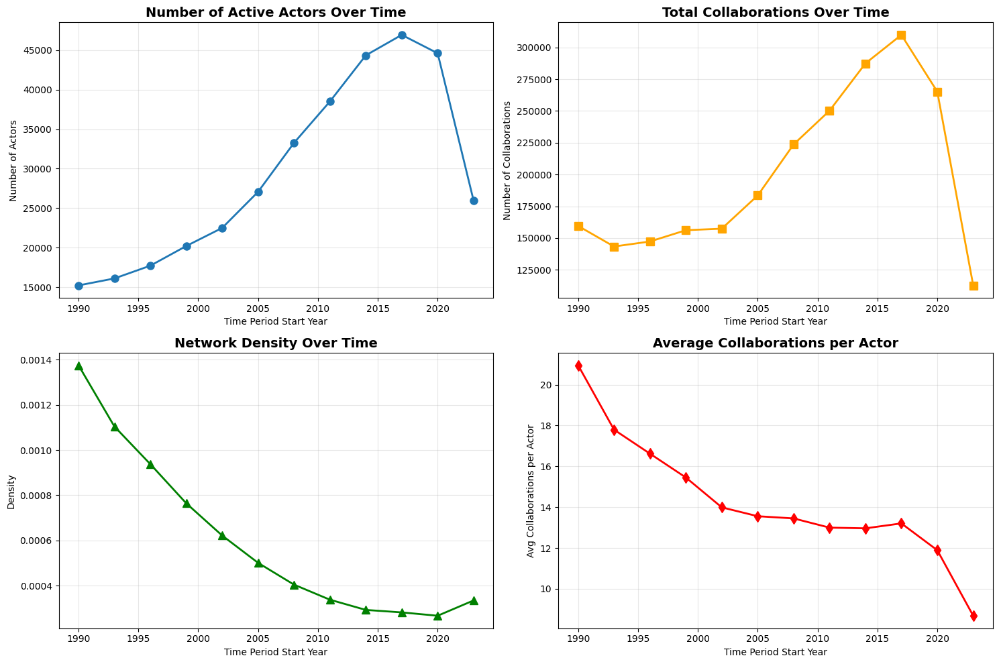

In [56]:
# Create visualizations of the temporal evolution
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Number of actors over time
ax1.plot(evolution_df['start_year'], evolution_df['nodes'], marker='o', linewidth=2, markersize=8)
ax1.set_title('Number of Active Actors Over Time', fontsize=14, fontweight='bold')
ax1.set_xlabel('Time Period Start Year')
ax1.set_ylabel('Number of Actors')
ax1.grid(True, alpha=0.3)

# Plot 2: Number of collaborations over time
ax2.plot(evolution_df['start_year'], evolution_df['edges'], marker='s', color='orange', linewidth=2, markersize=8)
ax2.set_title('Total Collaborations Over Time', fontsize=14, fontweight='bold')
ax2.set_xlabel('Time Period Start Year')
ax2.set_ylabel('Number of Collaborations')
ax2.grid(True, alpha=0.3)

# Plot 3: Network density over time
ax3.plot(evolution_df['start_year'], evolution_df['density'], marker='^', color='green', linewidth=2, markersize=8)
ax3.set_title('Network Density Over Time', fontsize=14, fontweight='bold')
ax3.set_xlabel('Time Period Start Year')
ax3.set_ylabel('Density')
ax3.grid(True, alpha=0.3)

# Plot 4: Average collaborations per actor
ax4.plot(evolution_df['start_year'], evolution_df['avg_collaborations_per_actor'], marker='d', color='red', linewidth=2, markersize=8)
ax4.set_title('Average Collaborations per Actor', fontsize=14, fontweight='bold')
ax4.set_xlabel('Time Period Start Year')
ax4.set_ylabel('Avg Collaborations per Actor')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [57]:
# Additional analysis: Year-over-year growth rates
print("\nYear-over-year growth analysis:")
for i in range(1, len(evolution_df)):
    prev_period = evolution_df.iloc[i-1]
    curr_period = evolution_df.iloc[i]
    
    actor_growth = ((curr_period['nodes'] - prev_period['nodes']) / prev_period['nodes']) * 100
    collab_growth = ((curr_period['edges'] - prev_period['edges']) / prev_period['edges']) * 100
    
    print(f"{curr_period['period']}: {actor_growth:+.1f}% actors, {collab_growth:+.1f}% collaborations")


Year-over-year growth analysis:
1993-1995: +5.8% actors, -10.2% collaborations
1996-1998: +10.0% actors, +2.7% collaborations
1999-2001: +14.1% actors, +6.0% collaborations
2002-2004: +11.3% actors, +0.8% collaborations
2005-2007: +20.3% actors, +16.6% collaborations
2008-2010: +22.9% actors, +21.9% collaborations
2011-2013: +15.7% actors, +11.9% collaborations
2014-2016: +15.2% actors, +14.9% collaborations
2017-2019: +5.8% actors, +7.8% collaborations
2020-2022: -5.0% actors, -14.4% collaborations
2023-2024: -41.8% actors, -57.5% collaborations


We can see from the plots above that even though the film industry is growing rapidly, the number of collaborations per actor is decreasing and thus the network is becoming less dense! There is also an opposite direction trend on each of those graphs. Probably it's due to the Covid-restrictions and SAG-AFTRA strike. Also -- the last time window was 2 years, not 3 :)